<a href="https://colab.research.google.com/github/shirleyrutgers/DataVis/blob/main/map.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

i have a full gis class
https://theaok.github.io/gisPy/

In [ ]:
import os, zipfile
import pandas as pd
import matplotlib.pyplot as plt

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab import data_table
data_table.enable_dataframe_formatter() #this enables spreadsheet view upon calling dataframe (without() )

### geopandas [if tight on time, just this]
https://geopandas.org/

a sister of pandas; does the job; tho not as fancy/interactive as folium or leafmap

just quick focus here on thematic/choloropleth maps: coloring polygons (states, counties, etc) with values of a var, say crime: green=low, red=hi

REFS (also good for self study):

https://geopandas.org/en/stable/gallery/choropleths.html

https://geopandas.org/en/stable/gallery/choro_legends.html

https://geopandas.org/en/stable/gallery/geopandas_rasterio_sample.html

In [ ]:
#!pip install geopandas
!pip install mapclassify
import geopandas as gpd
import mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.2 MB/s eta 0:00:00


In [ ]:
# say want to map housing values across nj counties; first need to get the map with counties
# (then we will get regular data with housing values and merge with counties data and color code the polygons)
# maps have their own files, a popular one is 'shapefile', so if you want to map nj counties
# first step is to get the geo data so google 'geography you're looking for + 'shapefile''
# eg 'nj counties shapefile',i found one and put on my website, keep it zipped!
# one shapefile consists of several files--keep them in one zipped folder and dont change their names
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC

In [ ]:
njC.dtypes #with geopandas can do stuff like with pandas :)

,0
COUNTY,object
COUNTY_LAB,object
CO,object
GNIS_NAME,object
GNIS,object
FIPSSTCO,object
FIPSCO,object
ACRES,float64
SQ_MILES,float64
POP2010,int64


In [ ]:
njC.head(2)

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,POP1990,POP1980,POPDEN2010,POPDEN2000,POPDEN1990,POPDEN1980,REGION,Shape_Leng,Shape_Area,geometry
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,275372,204615,450,414,451,335,COASTAL,650228.153906,1.702385e+10,"POLYGON ((443056.01 311529.77, 443068.44 31152..."
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,829592,849843,3774,3686,3459,3544,NORTHEASTERN,443326.122021,6.686010e+09,"POLYGON ((656200.963 783614.366, 656141.127 78..."


<Axes: >

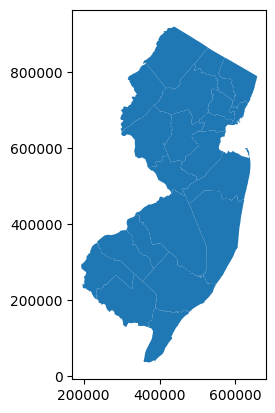

In [ ]:
njC.plot() #yay love the shape

<Axes: >

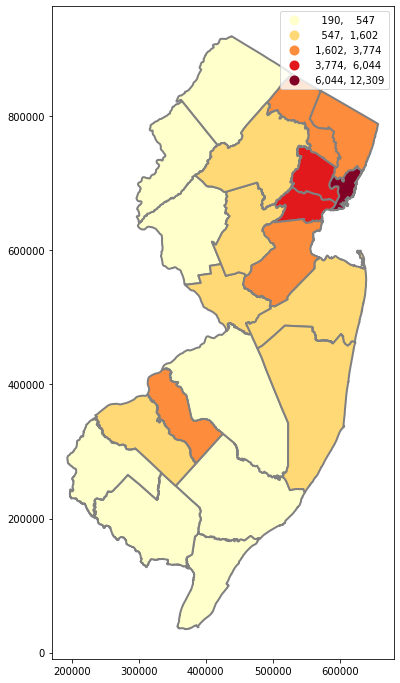

In [ ]:
#sometimes lucky and have the variable we want to map in the shapefile
njC.plot(figsize=(10,12),column='POPDEN2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}"}) #,ax=ax

<Axes: >

<Axes: >

[]

[]

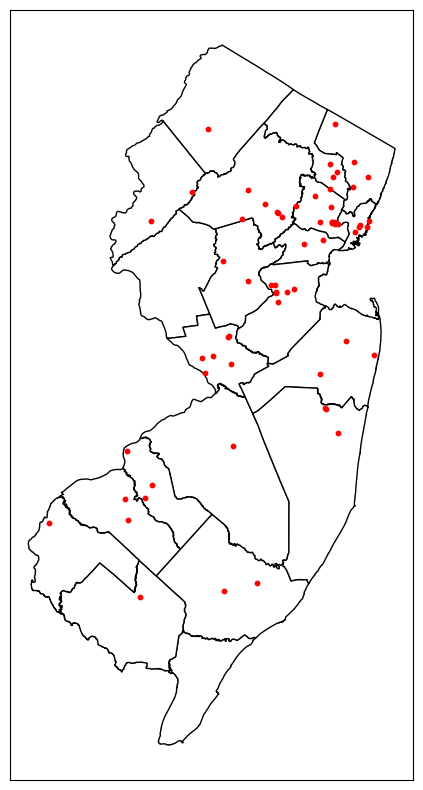

In [ ]:
# we can overlay layers; lets get nj uni shapefile on it
!wget -q -O col.zip  https://docs.google.com/uc?id=1bb9KES6QDE7cleE4L38yQ7939LlXUHB5&export=download
zip_ref = zipfile.ZipFile('col.zip', 'r');zip_ref.extractall(); zip_ref.close()

col = gpd.read_file('2007_11_30_NJ_COLL_UNIV_njsp.shp')
#col.dtypes

fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax, color='white', edgecolor='black',linewidth=1)
col.plot(ax=ax, marker='o', color='red', markersize=10)
#col.plot(column='ENROLL',markersize=50,legend=True,cmap='RdYlGn_r',scheme='QUANTILES',k=5,ax=ax)
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks
#ax.set_title('Watersheds by area ($mi^2$)')

In [ ]:
#ok that was fun but remember we want to map housing prices
#but we dont have that info in counies shapefile :(
#so we need to find it elsewhere...and...merge!
#2nd dataset:  housing prices
!wget -q -O zillow.csv  https://docs.google.com/uc?id=1Q4tCZT0EfaJP_WGwKcxuPaQ_dDFonW4E&export=download
zillow=pd.read_csv('zillow.csv')
zillow.head(3)
zil1=zillow[['UPPER','Dec 2012']]
zil1.rename(columns={'UPPER': 'COUNTY'}, inplace=True) #fix col names to match 1st dataset

,UPPER,Data Type,Aug 2012,Sep 2012,Oct 2012,Nov 2012,Dec 2012
0,NEW JERSEY,All Homes,256100,"$256,900","$258,300","$259,100",259700.0
1,ATLANTIC,All Homes,179900,"$179,700","$181,200","$183,100",185800.0
2,BERGEN,All Homes,375200,"$376,600","$377,000","$377,600",380000.0


<ipython-input-10-50a8c1cb7527>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zil1.rename(columns={'UPPER': 'COUNTY'}, inplace=True) #fix col names to match 1st dataset


In [ ]:
#merge
njC1 = pd.merge(njC, zil1, on='COUNTY',how='outer',indicator=True)
njC1[['COUNTY','Dec 2012','POPDEN2010','_merge']] #all good, NEW JERSEY expected not to merge
njC2 = pd.merge(njC, zil1, on='COUNTY',how='inner',indicator=False)

,COUNTY,Dec 2012,POPDEN2010,_merge
0,ATLANTIC,185800.0,450.0,both
1,BERGEN,380000.0,3774.0,both
2,BURLINGTON,197800.0,547.0,both
3,CAMDEN,149400.0,2257.0,both
4,CAPE MAY,313600.0,340.0,both
5,CUMBERLAND,120100.0,313.0,both
6,ESSEX,282800.0,6044.0,both
7,GLOUCESTER,175900.0,857.0,both
8,HUDSON,293100.0,12309.0,both
9,HUNTERDON,327000.0,293.0,both


<Axes: >

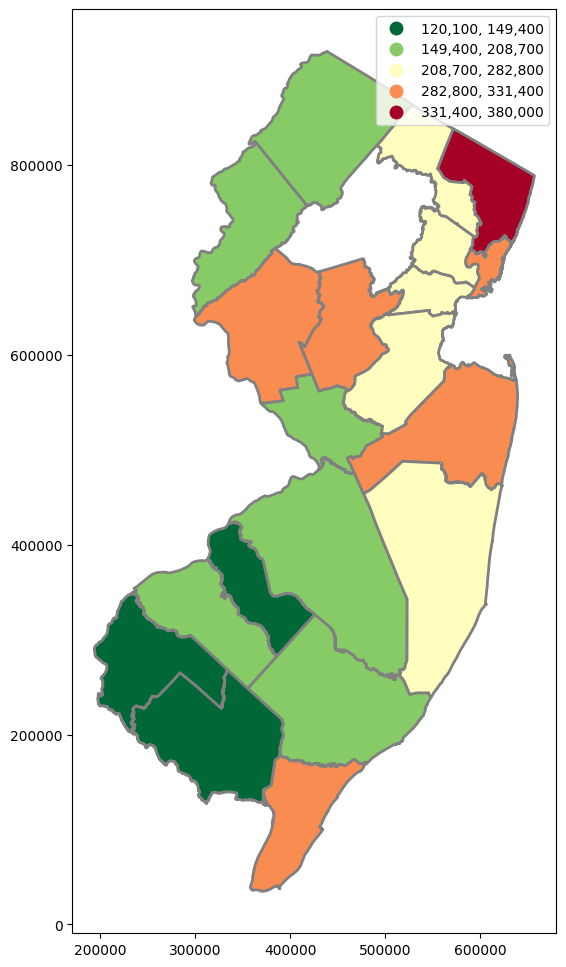

In [ ]:
njC2.plot(figsize=(10,12),column='Dec 2012',legend=True,cmap='RdYlGn_r',
          scheme='natural_breaks',k=5, edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}"})

#### abortions example
(make sure to have njC shapefile from previous sec)

In [ ]:
# get data: https://data.guttmacher.org/ has a nice API
# can click thru to get the table we want, which results in url (can open in webbrowser):
# https://data.guttmacher.org/counties/table?county=34001+34003+34005+34007+34009+34011+34013+34015+34017+34019+34021+34023+34025+34027+34029+34031+34033+34035+34037+34039+34041&topics=244+247&dataset=data&state=NJ
# and then can right click on 'download xls' (csv is messy in this case) button under the table and 'copy link address' and paste into wget (need quotes!):
!wget -q -O njAb.xls  "https://data.guttmacher.org/download?locationType=county&visualization=datatable&topic=244+247&locations=34001+34003+34005+34007+34009+34011+34013+34015+34017+34019+34021+34023+34025+34027+34029+34031+34033+34035+34037+34039+34041&measures=424+425+426+427+428+429+436+437+438+439+440+441+442&totalKey=NJ"

In [ ]:
# alternatively can scrap the table
#import requests
#url = 'https://data.guttmacher.org/counties/table?county=34001+34003+34005+34007+34009+34011+34013+34015+34017+34019+34021+34023+34025+34027+34029+34031+34033+34035+34037+34039+34041&topics=244+247&dataset=data&state=NJ'
#header = {
#  "User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.75 Safari/537.36",
#  "X-Requested-With": "XMLHttpRequest"
#}
#r = requests.get(url, headers=header)
#pd.read_html(r.text,match='U.S. County',flavor=None)[0].head(3) #for match just putting name of first col

In [ ]:
njAb=pd.read_excel('njAb.xls')
njAb.head(3)

,U.S. County,"Total no. of female contraceptive clients served at publicly funded clinics, 2015 [1]","Total publicly funded clinics, 2015 [1]","No. of federally qualified health centers, 2015 [1]","Total no. of female contraceptive clients served at publicly funded clinics, younger than 20, 2015 [1]","No. of female contraceptive clients served at federally qualified health centers, 2015 [1]","No. of health department clinics, 2015 [1]","No. of female contraceptive clients served at health department clinics, 2015 [1]","No. of hospital-based clinics, 2015 [1]","No. of Planned Parenthood clinics, 2015 [1]","No. of female contraceptive clients served at hospital-based clinics, 2015 [1]","No. of female contraceptive clients served at Planned Parenthood clinics, 2015 [1]","No. of other clinics, 2015 [1]","No. of female contraceptive clients served at other clinics, 2015 [1]"
0,NJ Total,"109,940",121,75,"16,880","35,510",2,880,8,26,"5,840","59,530",10,"8,190"
1,Atlantic,"3,300",6,4,670 [2],"2,000",0,0,0,2,0,"1,300",0,0
2,Bergen,"10,380",6,3,"1,000","2,790",0,0,1,2,780,"6,810",0,0


In [ ]:
#look at shapefile col names
njC

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,POP1990,POP1980,POPDEN2010,POPDEN2000,POPDEN1990,POPDEN1980,REGION,Shape_Leng,Shape_Area,geometry
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,275372,204615,450,414,451,335,COASTAL,650228.153906,1.702385e+10,"POLYGON ((443056.01 311529.77, 443068.44 31152..."
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,829592,849843,3774,3686,3459,3544,NORTHEASTERN,443326.122021,6.686010e+09,"POLYGON ((656200.963 783614.366, 656141.127 78..."
2,BURLINGTON,Burlington County,BUR,County of Burlington,882272,34005,5,525002.683590,820.316693,448734,...,395066,362542,547,516,482,442,SOUTHERN,788906.717476,2.286903e+10,"POLYGON ((436626.69 491361.78, 436701.19 49135..."
3,CAMDEN,Camden County,CAM,County of Camden,882273,34007,7,145650.507808,227.578918,513657,...,532498,471650,2257,2236,2340,2073,SOUTHERN,495010.034901,6.344511e+09,"POLYGON ((342763.99 423475.83, 342804.1 423429..."
4,CAPE MAY,Cape May County,CAP,County of Cape May,882274,34009,9,183126.574240,286.135272,97265,...,95089,82266,340,358,332,288,COASTAL,514564.858771,7.976962e+09,"POLYGON ((390389.73 177065.13, 390410.17 17705..."
5,CUMBERLAND,Cumberland County,CUM,County of Cumberland,882275,34011,11,321150.321572,501.797378,156898,...,138053,132866,313,292,275,265,SOUTHERN,704221.618565,1.398925e+10,"POLYGON ((333743.882 268331.623, 341456.371 26..."
6,ESSEX,Essex County,ESS,County of Essex,882276,34013,13,83034.859489,129.741968,783969,...,748281,850451,6044,6118,5768,6556,NORTHEASTERN,344556.557700,3.616984e+09,"POLYGON ((541167.94 755990.81, 541175.5 755969..."
7,GLOUCESTER,Gloucester County,GLO,County of Gloucester,882277,34015,15,215166.893094,336.198271,288288,...,230082,199917,857,758,684,595,SOUTHERN,560703.567470,9.372632e+09,"POLYGON ((315566.25 382993.34, 315650.44 38290..."
8,HUDSON,Hudson County,HUD,County of Hudson,882278,34017,17,32982.400794,51.535001,634266,...,553099,556972,12309,11817,10733,10808,NORTHEASTERN,381357.990132,1.436708e+09,"MULTIPOLYGON (((586210.281 660143.72, 586222.3..."
9,HUNTERDON,Hunterdon County,HUN,County of Hunterdon,882228,34019,19,279885.206384,437.320635,128349,...,107776,87361,293,279,246,200,CENTRAL,561760.929390,1.219175e+10,"POLYGON ((391770.815 705704.676, 392388.938 70..."


In [ ]:
njC['U.S. County']=njC['COUNTY_LAB'].str.replace(' County','') #get rid of ' County' [note space in front of county]
njC.head(5)

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,POP1980,POPDEN2010,POPDEN2000,POPDEN1990,POPDEN1980,REGION,Shape_Leng,Shape_Area,geometry,U.S. County
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,204615,450,414,451,335,COASTAL,650228.153906,1.702385e+10,"POLYGON ((443056.01 311529.77, 443068.44 31152...",Atlantic
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,849843,3774,3686,3459,3544,NORTHEASTERN,443326.122021,6.686010e+09,"POLYGON ((656200.963 783614.366, 656141.127 78...",Bergen
2,BURLINGTON,Burlington County,BUR,County of Burlington,882272,34005,5,525002.683590,820.316693,448734,...,362542,547,516,482,442,SOUTHERN,788906.717476,2.286903e+10,"POLYGON ((436626.69 491361.78, 436701.19 49135...",Burlington
3,CAMDEN,Camden County,CAM,County of Camden,882273,34007,7,145650.507808,227.578918,513657,...,471650,2257,2236,2340,2073,SOUTHERN,495010.034901,6.344511e+09,"POLYGON ((342763.99 423475.83, 342804.1 423429...",Camden
4,CAPE MAY,Cape May County,CAP,County of Cape May,882274,34009,9,183126.574240,286.135272,97265,...,82266,340,358,332,288,COASTAL,514564.858771,7.976962e+09,"POLYGON ((390389.73 177065.13, 390410.17 17705...",Cape May


In [ ]:
njCAb = pd.merge(njC, njAb, on='U.S. County',how='outer',indicator=True)
njCAb.head(50) # ok fine just junk from the bottom like sources etc and NJ as state didnt merge, so can do clean inner merge

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,"No. of female contraceptive clients served at federally qualified health centers, 2015 [1]","No. of health department clinics, 2015 [1]","No. of female contraceptive clients served at health department clinics, 2015 [1]","No. of hospital-based clinics, 2015 [1]","No. of Planned Parenthood clinics, 2015 [1]","No. of female contraceptive clients served at hospital-based clinics, 2015 [1]","No. of female contraceptive clients served at Planned Parenthood clinics, 2015 [1]","No. of other clinics, 2015 [1]","No. of female contraceptive clients served at other clinics, 2015 [1]",_merge
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,right_only
1,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549.0,...,"2,000",0,0,0,2,0,"1,300",0,0,both
2,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116.0,...,"2,790",0,0,1,2,780,"6,810",0,0,both
3,BURLINGTON,Burlington County,BUR,County of Burlington,882272,34005,5,525002.683590,820.316693,448734.0,...,480,0,0,1,1,580,"1,140",0,0,both
4,CAMDEN,Camden County,CAM,County of Camden,882273,34007,7,145650.507808,227.578918,513657.0,...,"1,490",0,0,2,2,"1,550","4,210",0,0,both
5,CAPE MAY,Cape May County,CAP,County of Cape May,882274,34009,9,183126.574240,286.135272,97265.0,...,660,2,880,0,0,0,0,0,0,both
6,CUMBERLAND,Cumberland County,CUM,County of Cumberland,882275,34011,11,321150.321572,501.797378,156898.0,...,"1,320",0,0,0,0,0,0,2,"1,230",both
7,ESSEX,Essex County,ESS,County of Essex,882276,34013,13,83034.859489,129.741968,783969.0,...,"4,300",0,0,0,4,0,"11,520",0,0,both
8,GLOUCESTER,Gloucester County,GLO,County of Gloucester,882277,34015,15,215166.893094,336.198271,288288.0,...,250,0,0,0,0,0,0,2,"1,230",both
9,HUDSON,Hudson County,HUD,County of Hudson,882278,34017,17,32982.400794,51.535001,634266.0,...,"8,600",0,0,0,0,0,0,3,"2,720",both


In [ ]:
njCAb = pd.merge(njC, njAb, on='U.S. County',how='inner',indicator=True) #inner merge
njCAb

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,"No. of female contraceptive clients served at federally qualified health centers, 2015 [1]","No. of health department clinics, 2015 [1]","No. of female contraceptive clients served at health department clinics, 2015 [1]","No. of hospital-based clinics, 2015 [1]","No. of Planned Parenthood clinics, 2015 [1]","No. of female contraceptive clients served at hospital-based clinics, 2015 [1]","No. of female contraceptive clients served at Planned Parenthood clinics, 2015 [1]","No. of other clinics, 2015 [1]","No. of female contraceptive clients served at other clinics, 2015 [1]",_merge
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,"2,000",0,0,0,2,0,"1,300",0,0,both
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,"2,790",0,0,1,2,780,"6,810",0,0,both
2,BURLINGTON,Burlington County,BUR,County of Burlington,882272,34005,5,525002.683590,820.316693,448734,...,480,0,0,1,1,580,"1,140",0,0,both
3,CAMDEN,Camden County,CAM,County of Camden,882273,34007,7,145650.507808,227.578918,513657,...,"1,490",0,0,2,2,"1,550","4,210",0,0,both
4,CAPE MAY,Cape May County,CAP,County of Cape May,882274,34009,9,183126.574240,286.135272,97265,...,660,2,880,0,0,0,0,0,0,both
5,CUMBERLAND,Cumberland County,CUM,County of Cumberland,882275,34011,11,321150.321572,501.797378,156898,...,"1,320",0,0,0,0,0,0,2,"1,230",both
6,ESSEX,Essex County,ESS,County of Essex,882276,34013,13,83034.859489,129.741968,783969,...,"4,300",0,0,0,4,0,"11,520",0,0,both
7,GLOUCESTER,Gloucester County,GLO,County of Gloucester,882277,34015,15,215166.893094,336.198271,288288,...,250,0,0,0,0,0,0,2,"1,230",both
8,HUDSON,Hudson County,HUD,County of Hudson,882278,34017,17,32982.400794,51.535001,634266,...,"8,600",0,0,0,0,0,0,3,"2,720",both
9,HUNTERDON,Hunterdon County,HUN,County of Hunterdon,882228,34019,19,279885.206384,437.320635,128349,...,0,0,0,0,1,0,690,0,0,both


In [ ]:
njCAb.dtypes

,0
COUNTY,object
COUNTY_LAB,object
CO,object
GNIS_NAME,object
GNIS,object
FIPSSTCO,object
FIPSCO,object
ACRES,float64
SQ_MILES,float64
POP2010,int64


In [ ]:
#need to convert string (object) to numeric (float or int; float is safer can have decimals if needed)
njCAb['publicly funded clinics, 2015'] = njCAb['Total publicly funded clinics, 2015 [1]'].astype(float)

In [ ]:
njCAb[['U.S. County','Total publicly funded clinics, 2015 [1]','publicly funded clinics, 2015']]

,U.S. County,"Total publicly funded clinics, 2015 [1]","publicly funded clinics, 2015"
0,Atlantic,6,6.0
1,Bergen,6,6.0
2,Burlington,4,4.0
3,Camden,10,10.0
4,Cape May,4,4.0
5,Cumberland,6,6.0
6,Essex,15,15.0
7,Gloucester,3,3.0
8,Hudson,14,14.0
9,Hunterdon,1,1.0


<Axes: >

[]

[]

Text(0.5, 1.0, 'count of publicly funded abortion clinics, 2015')

Text(0.5, 0.1, 'data from guttmacher.org \n            Publicly Funded Contraceptive Services at U.S. Clinics, 2015, Frost JJ, et al., 2017')

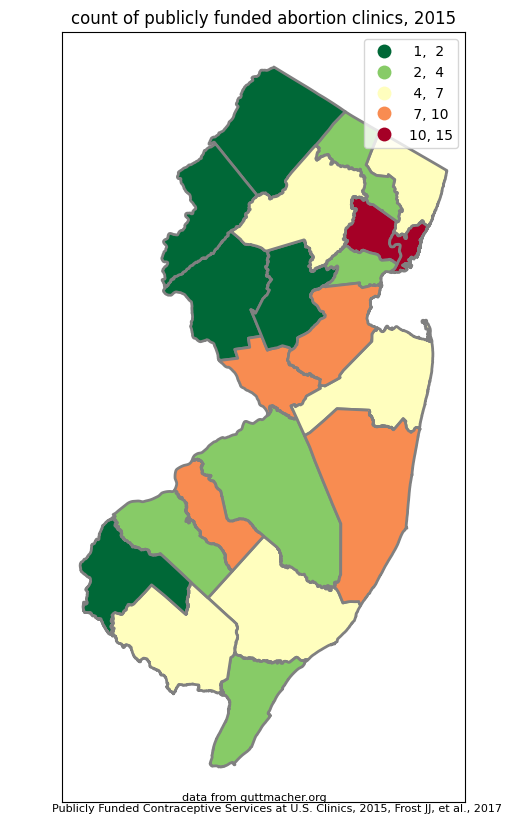

In [ ]:
fig, ax = plt.subplots(figsize=(6,10))

njCAb.plot(ax=ax,figsize=(10,12),column='publicly funded clinics, 2015',legend=True,cmap='RdYlGn_r',
          scheme='natural_breaks',k=5, edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}"})
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks
ax.set_title('count of publicly funded abortion clinics, 2015')
#ax.annotate('Note added to chart with minimum parameters', xy = (200000, 1000))
plt.figtext(0.5, 0.1,
            '''data from guttmacher.org
            Publicly Funded Contraceptive Services at U.S. Clinics, 2015, Frost JJ, et al., 2017''',
            ha="center", fontsize=8, #bbox={"facecolor":"white", "alpha":0.5, "pad":5}
            )

### foilum
[TODO: expand, elaborate, polish]

its been around for some time; stable; i had no issues

In [ ]:
!pip install geocoder
from geopy.geocoders import Nominatim

import folium as f
from folium.plugins import MarkerCluster, HeatMap

In [ ]:
f.Map(location=[45.5236, -122.6750]) #open street map is default
#m.save('m7.html')
#webbrowser.get('firefox').open_new_tab('m.html') #; webbrowser.open('m.html')

In [ ]:
geolocator = Nominatim(user_agent='adam.okulicz.kozaryn@gmail.com')
location = geolocator.geocode("401 cooper st camden nj")
print(location.address)

401, Cooper Street, Downtown, Camden, Camden County, New Jersey, 08102, United States


In [ ]:
print((location.latitude, location.longitude))

(39.94722236734694, -75.1220198367347)


In [ ]:
place = geolocator.geocode("camden nj") #first geocode location
place

Location(Camden, Camden County, New Jersey, United States, (39.9448402, -75.1198911, 0.0))

In [ ]:
f.Map(location=place[1])

In [ ]:
# do see many cool basemaps!: https://leaflet-extras.github.io/leaflet-providers/preview/
f.Map(location=place[1], tiles='Cartodb Positron', zoom_start=16)

In [ ]:
f.Map(location=place[1], tiles='Cartodb dark_matter', zoom_start=6)

In [ ]:
###adding markup by hand--easy! good for few u/a
m = f.Map(location=geolocator.geocode("401 cooper st, Camden nj 08102")[1], zoom_start=14)
#time.sleep(1)
f.Marker(geolocator.geocode("401 cooper st, Camden nj 08102")[1], popup='DPPA').add_to(m)
#time.sleep(1)
f.Marker(geolocator.geocode("321 cooper st, Camden nj 08102")[1], popup='bbb').add_to(m)
f.CircleMarker(geolocator.geocode("waterfront camden nj")[1], popup='waterfront').add_to(m)
#more cool options https://python-visualization.github.io/folium/latest/user_guide/vector_layers/circle_and_circle_marker.html
m.save('m.html') #and click on the left folder icon and download and open in webbrowser
m

In [ ]:
###adding markup by hand--easy! good for few u/a
m = f.Map(location=geolocator.geocode("401 cooper st, Camden nj 08102")[1], zoom_start=14)
#time.sleep(1)
f.Marker(geolocator.geocode("401 cooper st, Camden nj 08102")[1], popup='DPPA').add_to(m)
#time.sleep(1)
f.Marker(geolocator.geocode("321 cooper st, Camden nj 08102")[1], popup='bbb').add_to(m)
f.CircleMarker(geolocator.geocode("waterfront camden nj")[1], popup='waterfront').add_to(m)
#more cool options https://python-visualization.github.io/folium/latest/user_guide/vector_layers/circle_and_circle_marker.html
m.save('m.html') #and click on the left folder icon and download and open in webbrowser
m

#### marker clusterer, heatmap

many points, clustering, USEFUL! fancy!

http://blog.dominodatalab.com/creating-interactive-crime-maps-with-folium/

we do sf, but there are nj data too for about $100:
https://force.nj.com/ (few years back student was able to get lat lon); and nj ag for free (down to municipality):
https://www.njoag.gov/force/ and data:
https://njoag.app.box.com/s/upgf6yyi9g0fyjg6ednhqmr69dg9crfh

<br>philly shooting data (free!)
https://controller.phila.gov/philadelphia-audits/mapping-gun-violence/#/?year=2023&map=11.00%2F39.98500%2F-75.15000

In [ ]:
!wget -q -O sfCrim.csv  https://raw.githubusercontent.com/devanshmanu/StravAdd/master/SFPD_Incidents_-_Current_Year__2015_.csv

sfCrim = pd.read_csv('sfCrim.csv')
len(sfCrim)

#sfCrim[1:3]
sfCrim=sfCrim[0:1000] #for speed purposes
sfCrim.head(3)

112331

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location
0,150827188,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Sunday,09/20/2015,23:54,RICHMOND,UNFOUNDED,3000 Block of CLEMENT ST,-122.491851,37.781756,"(37.7817557255921, -122.491851328976)"
1,150827213,ASSAULT,INFLICT INJURY ON COHABITEE,Sunday,09/20/2015,23:45,INGLESIDE,"ARREST, BOOKED",100 Block of LOEHR ST,-122.413676,37.712617,"(37.7126165766239, -122.413676487435)"
2,150827213,ASSAULT,ATTEMPTED HOMICIDE WITH A KNIFE,Sunday,09/20/2015,23:45,INGLESIDE,"ARREST, BOOKED",100 Block of LOEHR ST,-122.413676,37.712617,"(37.7126165766239, -122.413676487435)"


In [ ]:
#create empty map zoomed in on San Francisco
m = f.Map(location=(37.76, -122.45), zoom_start=12)

loc = []
#add a marker for every record
for each in sfCrim.iterrows():
    loc.append([each[1]['Y'],each[1]['X']])

loc[0:3] #just print first 3 to have a look

m.add_children(MarkerCluster(locations=loc)) #use a clustered view
#m.save('m10.html')
#very cool! hover over it--pups u in blue a polygon that the aggregate refers to!

[[37.7817557255921, -122.491851328976],
 [37.7126165766239, -122.413676487435],
 [37.7126165766239, -122.413676487435]]

<ipython-input-35-d290920165c8>:11: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(MarkerCluster(locations=loc)) #use a clustered view


In [ ]:
#now with crim popup
sanfran_map = f.Map(location = [37.76, -122.45], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = MarkerCluster().add_to(sanfran_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(sfCrim.Y, sfCrim.X, sfCrim.Category):
    f.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
sanfran_map

In [ ]:
### heatmap http://www.jackboot7.com/visualizing-tweets.html

m = f.Map(location=(37.76, -122.45), zoom_start=12)
m.add_children(HeatMap(loc))


<ipython-input-37-a64790162e58>:4: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(HeatMap(loc))


#### polygons


In [ ]:
#adding geojson
map = f.Map()
map

In [ ]:
f.GeoJson('https://raw.githubusercontent.com/datasets/geo-admin1-us/master/data/admin1-us.geojson').add_to(map)
map

In [ ]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)
state_geo = f"{url}/us-states.json"
state_unemployment = f"{url}/US_Unemployment_Oct2012.csv"
state_data = pd.read_csv(state_unemployment)

In [ ]:
states = gpd.read_file(state_geo)
print(states.head())

   id        name                                           geometry
0  AL     Alabama  POLYGON ((-87.3593 35.00118, -85.60668 34.9847...
1  AK      Alaska  MULTIPOLYGON (((-131.60202 55.11798, -131.5691...
2  AZ     Arizona  POLYGON ((-109.0425 37.00026, -109.04798 31.33...
3  AR    Arkansas  POLYGON ((-94.47384 36.50186, -90.15254 36.496...
4  CA  California  POLYGON ((-123.23326 42.00619, -122.37885 42.0...


In [ ]:
state_data.head(50)

,State,Unemployment
0,AL,7.1
1,AK,6.8
2,AZ,8.1
3,AR,7.2
4,CA,10.1
5,CO,7.7
6,CT,8.4
7,DE,7.1
8,FL,8.2
9,GA,8.8


In [ ]:
m = f.Map(location=[40, -95], zoom_start=4)
m

In [ ]:
f.Choropleth(
    geo_data=state_geo, #geo data obj: state_geo
    name="choropleth",
    data=state_data,   #regular data object
    columns=["State", "Unemployment"], # 1st var is join or merge var; 2nd is map var
#KLUDGE: may not merge! first do a dry run to make sure everything merges fine!!
    key_on="feature.id",  #this is merge/join var from geojson; just prefix ith 'feature
    fill_color="YlGnBu", #pick some color, opacities
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Unemployment Rate (%)",
).add_to(m)

f.LayerControl().add_to(m)

m
#m.save('m2.html')

### [*] leafmap

we list it as 2nd to leaflet as it does require more dependencies; also may be more buggy

lots of great functionality; easy to use

also interactive! almost like full blown gis soft like qgis: eg click on the right the toolbox and can do a ton of stuff incl open attr table etc (may need additional libraries like ipysheet)

In [ ]:
!pip install leafmap
!pip install pycrs
!pip install osmnx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 KB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 78.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 KB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.6/99.6 KB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 KB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 KB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 KB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 59.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 KB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for pycrs: filename=PyCRS-1.0.2-py3-none-any.whl size=32702 sha256=a730af2fc54d21d3565a1e6fb2c3b3ff7c2e40299cbede2303f9eb8130f2f2b0
  Stored in directory: /root/.cache/pip/wheels/94/01/24/bc7bff66667ef317615144a15e04593a08d9bb322f2c427d6c
Successfully built pycrs
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 KB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 69.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 62.4 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.27.1
    Uninstalling requests-2.27.1:
      Successfully uninstalled requests-2.2

In [ ]:
#ton of dependencies; also saying here which for what not to get lost
import leafmap
import pycrs #may be needed for some imported data such as shapefiles
import geopandas #may be needed to for some files such a kml
import osmnx #for geocoding, eg we geocode camden
import mapclassify #for thematic maps

In [ ]:
#leafmap.basemaps.keys() #ton of possible basemaps

In [ ]:
m = leafmap.Map(
    #google_map="ROADMAP", # ROADMAP HYBRID #change basemap
    center=(40, -100), zoom=4, height="400px", width="800px",
    #draw_control=False, #turn off controls
    #measure_control=False,
    #fullscreen_control=False,
    #attribution_control=True,
    )
#m.to_html("mymap.html")
m

Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [ ]:
#add geojson
m = leafmap.Map(center=[0, 0], zoom=2)
cou = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
cab = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/cable_geo.geojson'
style = {
    "stroke": True,
    "color": "#0000ff",
    "weight": 2,
    "opacity": 1,
    "fill": True,
    "fillColor": "#0000ff",
    "fillOpacity": 0.1,
}
hover_style = {"fillOpacity": 0.7}
m.add_geojson(cou, layer_name="Countries", style=style, hover_style=hover_style)
m.add_geojson(cab, layer_name="Cable lines")
m

Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [ ]:
#add shapefile
m = leafmap.Map(center=[0, 0], zoom=2)
in_shp = 'https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip'
m.add_shp(in_shp, layer_name="Countries")
m


Downloading...
From: https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip
To: /content/cache/shp/countries.zip
100%|██████████| 132k/132k [00:00<00:00, 9.06MB/s]


Extracting files...


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [ ]:
#add kml
m = leafmap.Map()
in_kml = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml'
m.add_kml(in_kml, layer_name="US States KML")
m

Downloading...
From: https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml
To: /content/us_states.kml
95.4kB [00:00, 42.7MB/s]                   


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#can add csv straightup as long as have x y
m = leafmap.Map()
df = pd.read_csv('https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv') #pandas
m.add_points_from_xy(df, x="longitude", y="latitude")
m
###straight from csv file:
#m = leafmap.Map()
#data = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv'
#m.add_points_from_xy(data, x="longitude", y="latitude")
#m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#heatmap
m = leafmap.Map()
in_csv = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/world_cities.csv"
m.add_heatmap(
    in_csv,
    latitude="latitude",
    longitude='longitude',
    value="pop_max",
    name="Heat map",
    radius=15, #play with radius to achieve desired heat
)
colors = ['blue', 'lime', 'red']
vmin = 0
vmax = 10000
m.add_colorbar(colors=colors, vmin=vmin, vmax=vmax)
m.add_title("World Population Heat Map", font_size="20px", align="center")
m

The ipyleaflet map does not support titles.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#thematic map
data = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
m = leafmap.Map()
m.add_data(
    data, column='POP_EST', scheme='Quantiles', cmap='Blues', legend_title='Population'
)
m
'''classification schemes:
BoxPlot
EqualInterval
FisherJenks
FisherJenksSampled
HeadTailBreaks
JenksCaspall
JenksCaspallForced
JenksCaspallSampled
MaxP
MaximumBreaks
NaturalBreaks
Quantiles
Percentiles
StdMean
UserDefined'''

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

'classification schemes:\nBoxPlot\nEqualInterval\nFisherJenks\nFisherJenksSampled\nHeadTailBreaks\nJenksCaspall\nJenksCaspallForced\nJenksCaspallSampled\nMaxP\nMaximumBreaks\nNaturalBreaks\nQuantiles\nPercentiles\nStdMean\nUserDefined'

In [ ]:
#geocode
m = leafmap.Map(toolbar_control=False, layers_control=True)
m.add_osm_from_geocode("Camden NJ", layer_name='Cam')
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#add census data
for key in leafmap.get_census_dict():
    print(key)

Current
ACS 2021
ACS 2019
ACS 2018
ACS 2017
ACS 2016
ACS 2015
ACS 2014
ACS 2013
ACS 2012
ECON 2012
Census 2020
Census 2010
Physical Features
Decennial Census 2020
Decennial Census 2010
Decennial Census 2000
Decennial Physical Features


In [ ]:
census_data_dict = leafmap.get_census_dict()
census_data_dict['Census 2020']['layers']

['Alaska_Native_Regional_Corporations10465',
 'Alaska_Native_Regional_Corporations_Labels60868',
 'Alaska_Native_Village_Statistical_Areas34178',
 'Alaska_Native_Village_Statistical_Areas_Labels14319',
 'American_Indian_Joint-Use_Areas11842',
 'American_Indian_Joint-Use_Areas_Labels32943',
 'Census_Block_Groups59805',
 'Census_Block_Groups_Labels32376',
 'Census_Blocks1978',
 'Census_Blocks_Labels63431',
 'Census_Designated_Places65166',
 'Census_Designated_Places_Labels61459',
 'Census_Divisions8578',
 'Census_Divisions_Labels29679',
 'Census_Regions16659',
 'Census_Regions_Labels31526',
 'Census_Tracts7651',
 'Census_Tracts_Labels33558',
 'Combined_New_England_City_and_Town_Areas35117',
 'Combined_New_England_City_and_Town_Areas_Labels20328',
 'Combined_Statistical_Areas61231',
 'Combined_Statistical_Areas_Labels52090',
 'Consolidated_Cities65047',
 'Consolidated_Cities_Labels30018',
 'Counties',
 'Counties_Labels19364',
 'County_Subdivisions63689',
 'County_Subdivisions_Labels25452'

In [ ]:
m = leafmap.Map(zoom=5,center=[40,-90])
m.add_census_data(wms="Census 2020", layer="States")
m.add_census_data(wms="Census 2020", layer="States_Labels49388")
m
#or in toolbox click 9th icon Get US Census Data; need to zoom; and may not work (i had issues with some)

Map(center=[40, -90], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [ ]:
#vis land cover change #hit toolbar on the right, Layers, and turn on and off 2019
m = leafmap.Map(center=[36.1, -115.2],zoom=9)
m.add_basemap('NLCD 2001 CONUS Land Cover')
m.add_basemap('NLCD 2019 CONUS Land Cover')
m.add_legend(builtin_legend='NLCD')
m

Map(center=[36.1, -115.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [ ]:
#lidar WONT RUN IN COLAB, need other interpreter; or maybe other backend
#https://leafmap.org/notebooks/48_lidar/
#!pip install laspy[lazrs,laszip]
#!pip install leafmap[lidar] open3d

In [ ]:
#url = 'https://github.com/giswqs/data/raw/main/lidar/madison.zip'
#filename = 'madison.las'
#if not os.path.exists(filename):
#    leafmap.download_file(url, 'madison.zip', unzip=True)

In [ ]:
#las = leafmap.read_lidar(filename)
#las.header


In [ ]:
#leafmap.view_lidar(filename, backend='open3d', background='white')

## satelite img

folium is just one library

there are others, eg can get sat img straight to python, kind of similar like these APIs to Fed and World Bank we did earlier; eg check out these links:

https://carpentries-incubator.github.io/geospatial-python/

https://sites.northwestern.edu/researchcomputing/2021/11/19/downloading-satellite-images-made-easy/

## notes to myself

the whole course, geo dat sci:
https://darribas.org/gds_course/content/home.html

LATER:
 basemap! guess the first one! used to use it, but dead, depreciated in favor of cartopy
https://jakevdp.github.io/PythonDataScienceHandbook/04.13-geographic-data-with-basemap.html